# XMem Colab Demo

[[arXiv]](https://arxiv.org/abs/2207.07115) [[PDF]](https://arxiv.org/pdf/2207.07115.pdf) [[Code]](https://github.com/hkchengrex/XMem) [[Project Page]](https://hkchengrex.github.io/XMem/)

![framework](https://imgur.com/ToE2frx.jpg)

You can make a copy of this notebook to change the input video or mask.

In [1]:
!nvidia-smi

import torch

if torch.cuda.is_available():
  print('Using GPU')
  device = 'cuda'
else:
  print('CUDA not available. Please connect to a GPU instance if possible.')
  device = 'cpu'

Mon Jul  1 20:39:13 2024       
+-----------------------------------------------------------------------------------------+
| NVIDIA-SMI 555.42.02              Driver Version: 555.42.02      CUDA Version: 12.5     |
|-----------------------------------------+------------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id          Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |           Memory-Usage | GPU-Util  Compute M. |
|                                         |                        |               MIG M. |
|=========================================+========================+======================|
|   0  NVIDIA GeForce GTX 1080 Ti     Off |   00000000:01:00.0 Off |                  N/A |
| 23%   26C    P8              8W /  250W |      12MiB /  11264MiB |      0%      Default |
|                                         |                        |                  N/A |
+-----------------------------------------+-----

# Get our code and install prerequisites

In [ ]:
!git clone https://github.com/hkchengrex/XMem.git
%cd XMem
!pip install opencv-python
!pip install matplotlib
!pip install -U numpy
!pip install -r requirements.txt

# Basic setup

In [ ]:
%matplotlib inline

In [ ]:
import os
from os import path
from argparse import ArgumentParser
import shutil

import torch
import torch.nn.functional as F
from torch.utils.data import DataLoader
import numpy as np
from PIL import Image

from inference.data.test_datasets import LongTestDataset, DAVISTestDataset, YouTubeVOSTestDataset
from inference.data.mask_mapper import MaskMapper
from model.network import XMem
from inference.inference_core import InferenceCore

from progressbar import progressbar

torch.set_grad_enabled(False)

# default configuration
config = {
    'top_k': 30,
    'mem_every': 5,
    'deep_update_every': -1,
    'enable_long_term': True,
    'enable_long_term_count_usage': True,
    'num_prototypes': 128,
    'min_mid_term_frames': 5,
    'max_mid_term_frames': 10,
    'max_long_term_elements': 10000,
}

network_path = './saves/XMem.pth' # change this to the path of the model you want to use

network = XMem(config,network_path).eval().to(device)

# Load some data

 I used one of the videos from ifl-computer. 

In [ ]:


video_name =  'video.mp4'
mask_name = 'first_frame.png'
print(video_name)

# Preview the video and first-frame annotation

The first frame mask is a PNG with a color palette.

In [ ]:
from IPython.display import HTML
from base64 import b64encode
data_url = "data:video/mp4;base64," + b64encode(open(video_name, 'rb').read()).decode()
HTML("""
<video width=400 controls>
      <source src="%s" type="video/mp4">
</video>
""" % data_url)

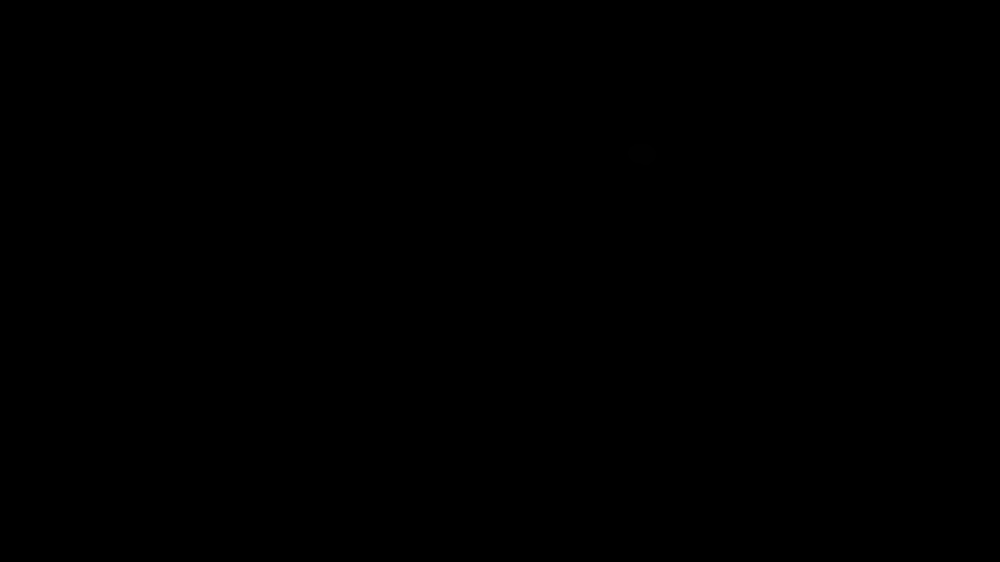

In [ ]:
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

# Read the mask
img = mpimg.imread(mask_name)

# Display the mask
plt.imshow(img)
plt.axis('off')  # Turn off the axis
plt.show()

# Convert the mask to a numpy array

Note that the object IDs should be consecutive and start from 1 (0 represents the background). If they are not, see `inference.data.mask_mapper` and `eval.py` on how to use it.

In [ ]:
mask = np.array(Image.open(mask_name))
print(np.unique(mask))
num_objects = len(np.unique(mask)) - 1

[0 1]


# Propagte frame-by-frame

0


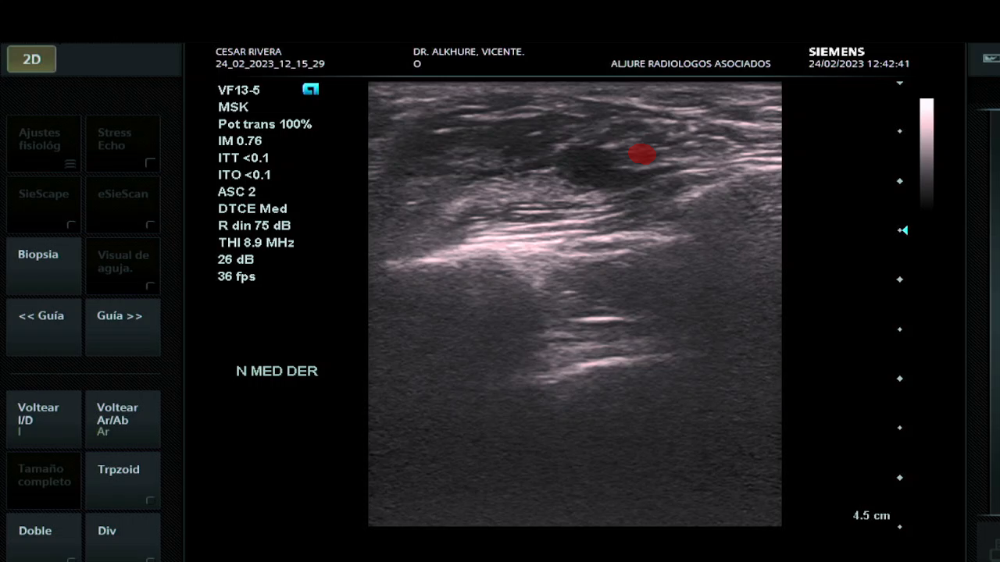

30


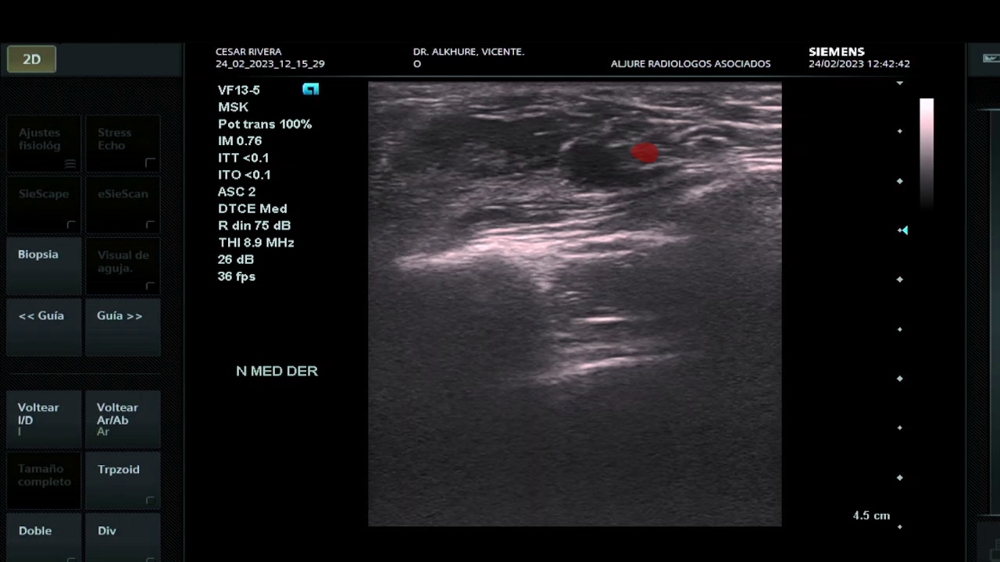

60


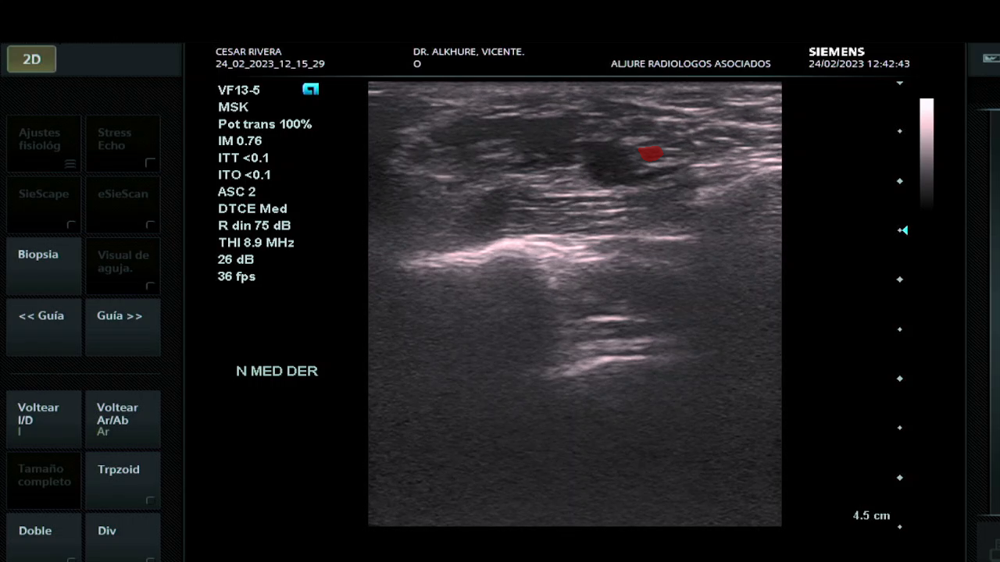

90


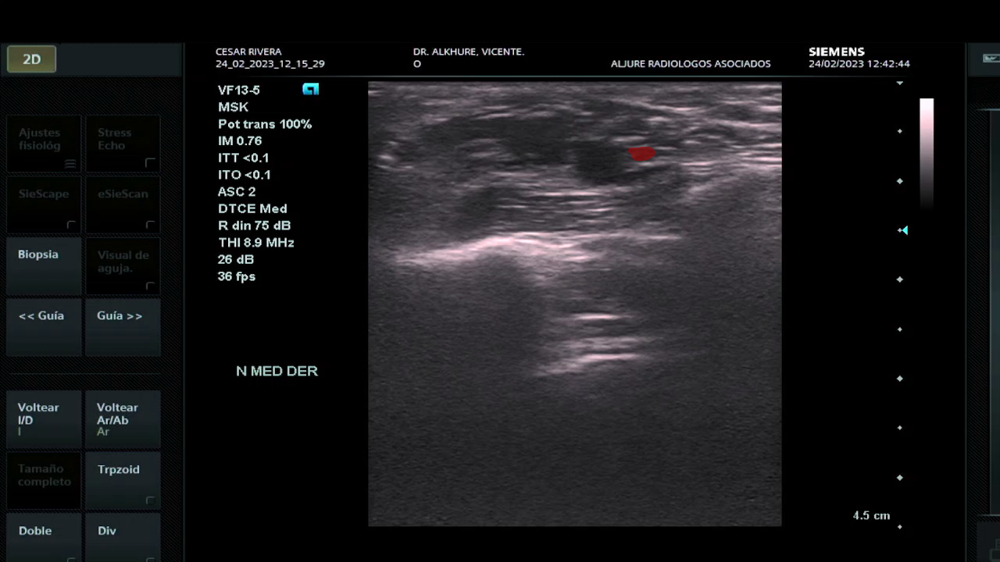

120


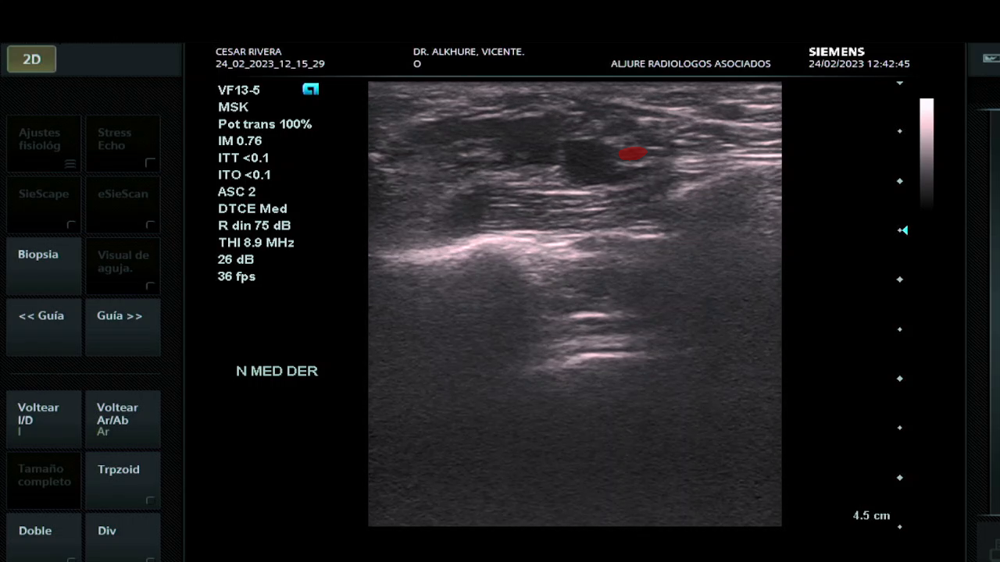

150


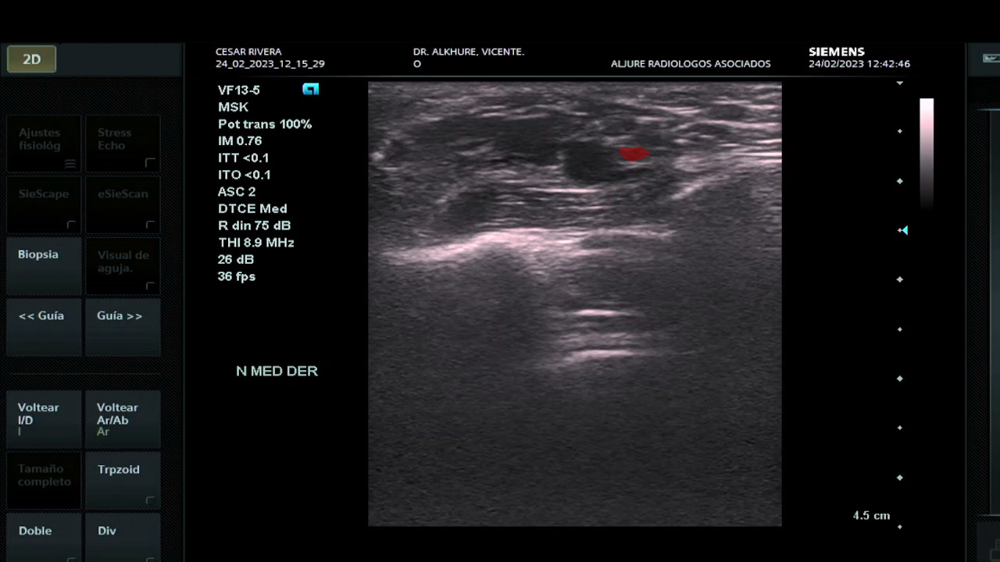

180


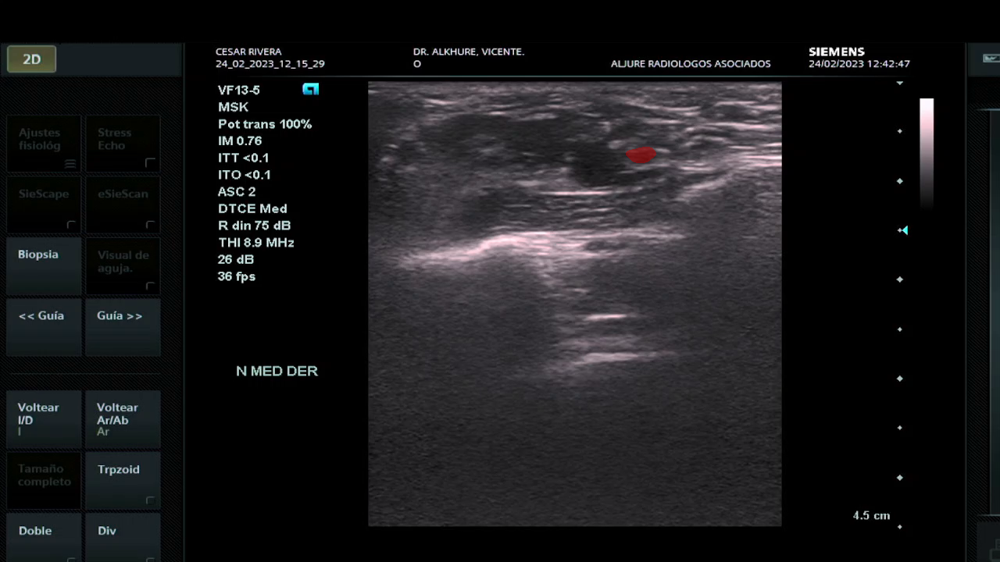

210


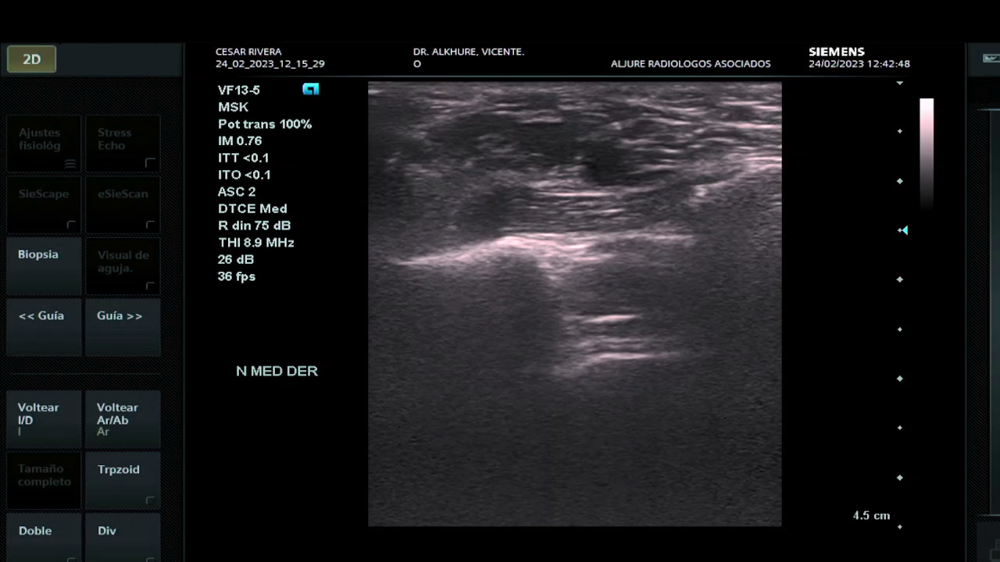

240


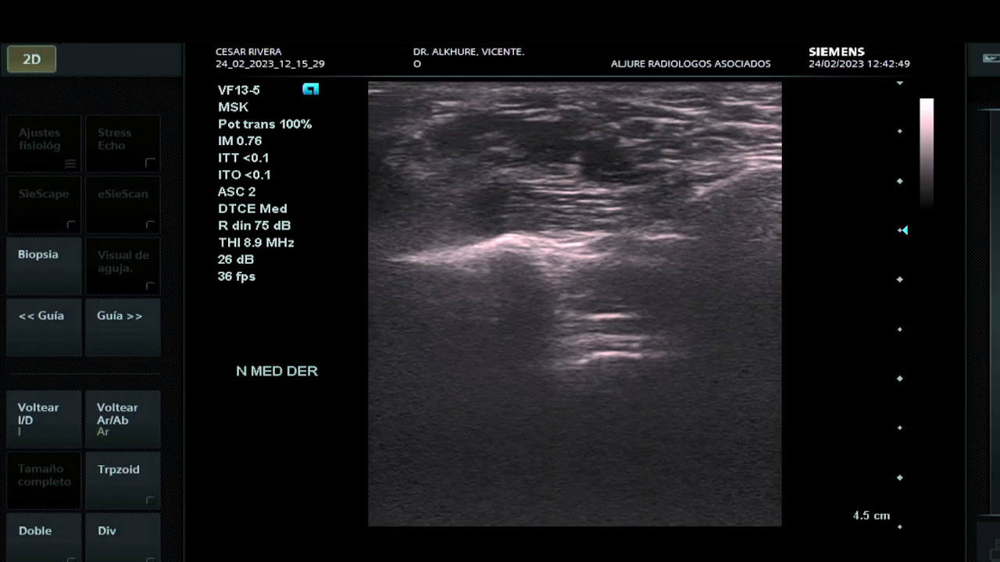

270


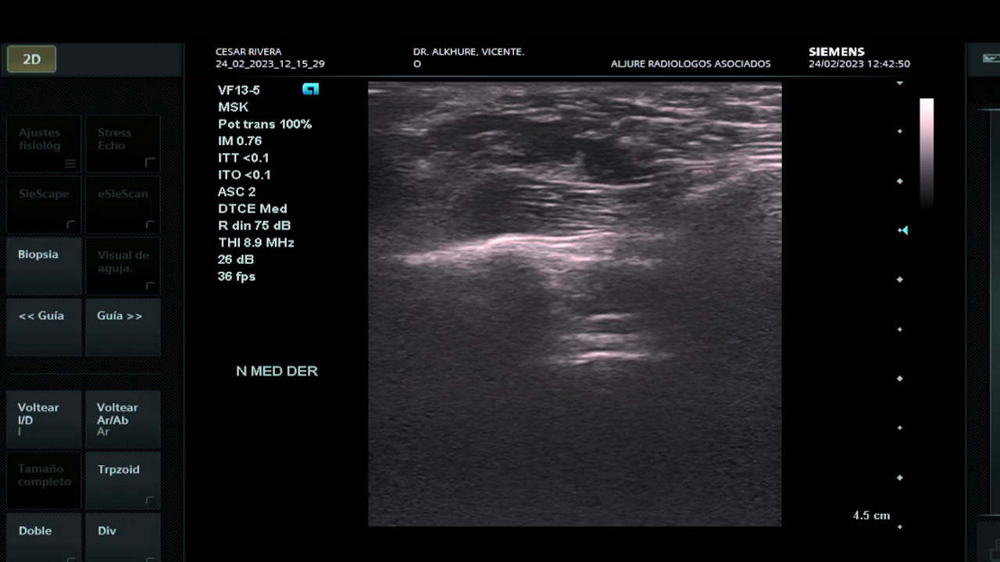

300


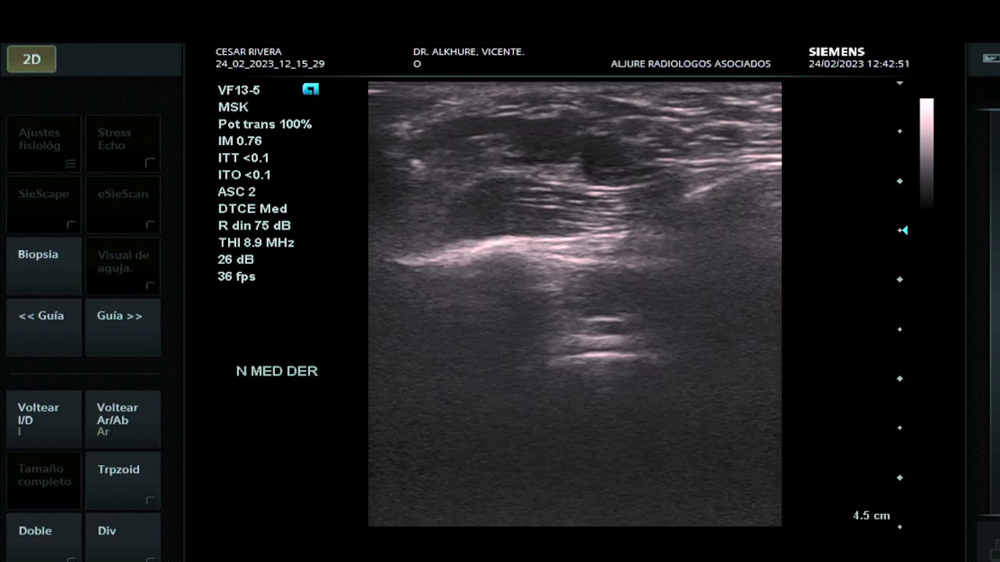

330


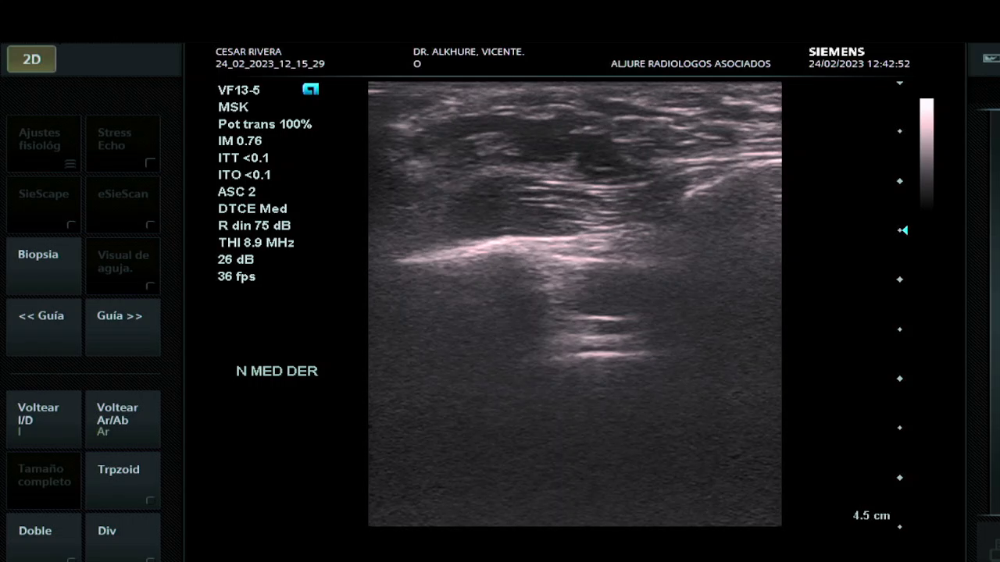

360


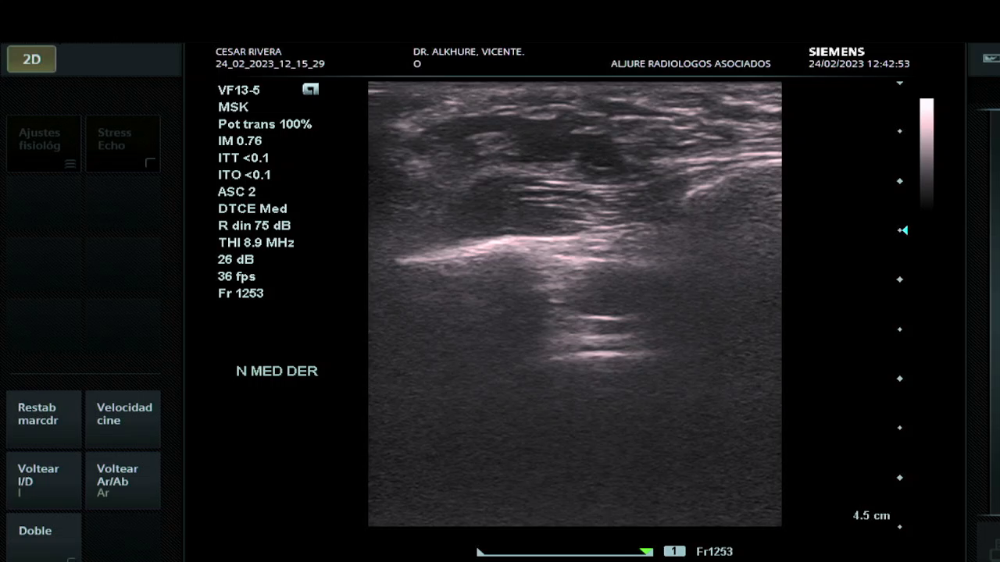

390


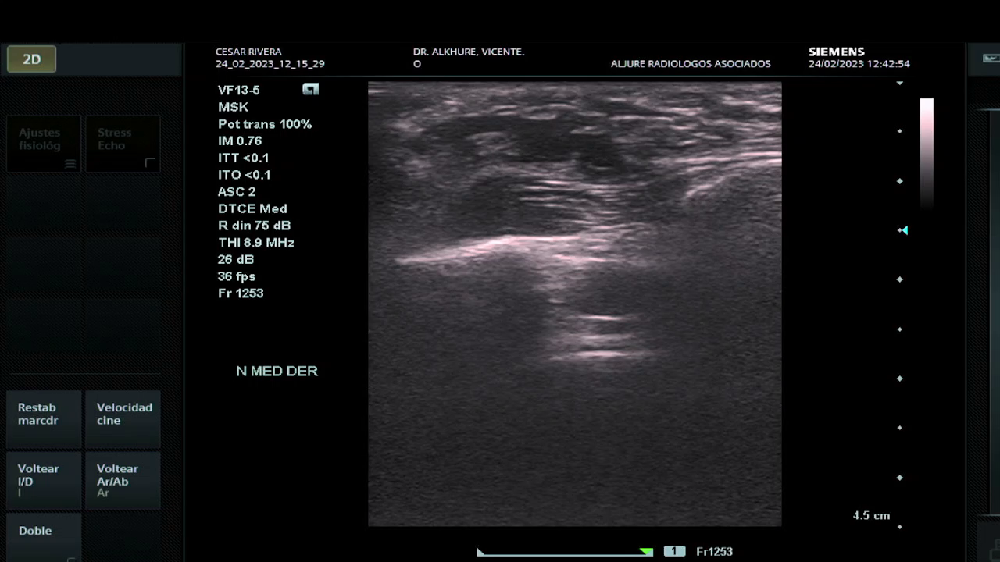

In [ ]:
import cv2
from inference.interact.interactive_utils import image_to_torch, index_numpy_to_one_hot_torch, torch_prob_to_numpy_mask, overlay_davis

torch.cuda.empty_cache()

processor = InferenceCore(network, config=config)
processor.set_all_labels(range(1, num_objects+1)) # consecutive labels
cap = cv2.VideoCapture(video_name)

# You can change these two numbers
frames_to_propagate = 417
visualize_every = 50

current_frame_index = 0

with torch.cuda.amp.autocast(enabled=True):
  while (cap.isOpened()):
    # load frame-by-frame
    _, frame = cap.read()
    if frame is None or current_frame_index > frames_to_propagate:
      break

    # convert numpy array to pytorch tensor format
    frame_torch, _ = image_to_torch(frame, device=device)
    if current_frame_index == 0:
      # initialize with the mask
      mask_torch = index_numpy_to_one_hot_torch(mask, num_objects+1).to(device)
      # the background mask is not fed into the model
      prediction = processor.step(frame_torch, mask_torch[1:])

    else:
      # propagate only
      prediction = processor.step(frame_torch)

    # argmax, convert to numpy
    prediction = torch_prob_to_numpy_mask(prediction)

    if current_frame_index % visualize_every == 0:
      print(current_frame_index)
      visualization = overlay_davis(frame, prediction)
      display(Image.fromarray(visualization))

    current_frame_index += 1